In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pylab as plt
import matplotlib.colors as colors
import matplotlib.patches as patches
import torchvision
import matplotlib.patches as patches
from sklearn.cluster import KMeans

import os
import time
import torch
import sys
import argparse
sys.path.insert(0, '../../shared_code')
from model_loader_func import * 
from dataloader_func import *
from quality_metrics_func import *
from linear_approx import *
from inverse_tasks_func import synthesis
from plotting_func import *
from algorithm_inv_prob import * 
from trainer import make_loader
%matplotlib inline

In [287]:
print(torch.__version__)
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
device

2.5.0+cu124


device(type='cuda')

In [289]:
# results_dir = '/mnt/home/zkadkhodaie/ceph/21_hierarchical_conditional_prior/results/'
compute_UNet_RF(num_enc_conv=[4,4,4,4], num_mid_conv=4, kernel_size=3 )

264

## Load denoisers


In [290]:
denoisers = {}

root_path = '/mnt/home/zkadkhodaie/ceph/21_hierarchical_conditional_prior/denoisers/'

paths = { 
         # 'mixture-color': 'UNet_flex/imagenet/0to300_RF_84x84_set_size_1232457_color_64x64/',
         'mixture-color-large-no-skip':'UNet_flex/imagenet/0to300_RF_232x232_set_size_1232457_color_no_skips_64x64/',       
         'mixture-color-large':'UNet_flex/imagenet/0to300_RF_232x232_set_size_1232457_color_64x64/',                  
         'mixture-color-deep-no-skip':'UNet_flex/imagenet/0to255_RF_84x84_set_size_1232457_color_no_skip_deep_dec_64x64/',
         # 'mixture-color-deep-no-skip-128':'UNet_flex/imagenet/0to255_RF_128x128_set_size_1232457_color_no_skip_deep_dec_128x128/'
         # 'mixture-modified-color': 'UNet_flex/imagenet/0to300_RF_84x84_set_size_1232457_color_64x64/',
         # 'mixture-modified-color-large-no-skip':'UNet_flex/imagenet/0to300_RF_232x232_set_size_1232457_color_no_skips_64x64/',
         # 'mixture-modified-color-large':'UNet_flex/imagenet/0to300_RF_232x232_set_size_1232457_color_64x64/',
         
         'mixture-modified-color-deep-no-skip':'UNet_flex/imagenet/0to255_RF_84x84_set_size_1232457_color_no_skip_deep_dec_64x64/',
    
        }

groups = paths.keys()


for group in groups: 
    path = root_path + paths[group]
    
    print('loading group ' , group )
    if 'modified' in group.split('-'):
        new_arch = 'UNet_conditional_mean_matching'
    else: 
        new_arch = None
    denoisers[group] = load_learned_model(path, print_args=True, new_arch=new_arch)
    start_time_total = time.time()        
    print("--- %s seconds ---" % (round(time.time() - start_time_total)))
     

loading group  mixture-color-large-no-skip
*************** saved arguments:*************
arch_name UNet_flex
lr 0.001
batch_size 512
num_epochs 1000
lr_freq 100
loss_weight False
noise_level_range [0, 300]
quadratic_noise True
rescale False
swap False
set_size 1232457
imagenet_subset_ids None
self_cond False
data_name imagenet
data_root_path /mnt/home/zkadkhodaie/ceph/datasets/
dir_name /mnt/home/zkadkhodaie/ceph/21_hierarchical_conditional_prior/denoisers/UNet_flex/imagenet/0to300_RF_232x232_set_size_1232457_color_no_skips_64x64
optional_dir_label color_no_skips
device cuda
debug False
kernel_size 3
padding 1
skip False
num_channels 3
bias True
RF 232
coarse True
num_kernels [64, 128, 256, 512, 1024]
num_blocks 4
num_enc_conv [4, 4, 4, 4]
num_mid_conv 3
num_dec_conv [4, 4, 4, 4]
NormType LayerNorm
inter_skip True
data_path /mnt/home/zkadkhodaie/ceph/datasets/imagenet
******************************************************
number of parameters is  52982851
train mode: False
--- 0 second

In [291]:

denoisers.keys()

dict_keys(['mixture-color-large-no-skip', 'mixture-color-large', 'mixture-color-deep-no-skip'])

In [292]:
for group in groups:
    if 'modified' in group.split('-'):
        denoisers[group].match_only_mid = True
        print(denoisers[group].match_only_mid)
        

# Load datasets 

In [293]:
test_sets = torch.load( '/mnt/home/zkadkhodaie/ceph/datasets/imagenet/test_64x64_color_list.pt', weights_only=True) 


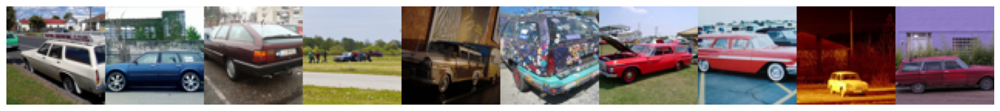

In [294]:
show_im_grid(test_sets[0][0:10] )


In [295]:
print('number of images in each class:', test_sets[0].shape)
K = test_sets[0].shape[2]
n_channels = test_sets[0].shape[1]
print(len(test_sets))

number of images in each class: torch.Size([49, 3, 64, 64])
999


tensor(0.4428)


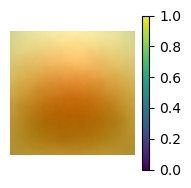

In [296]:
dist_mean = torch.concatenate(test_sets).mean(dim = (0))
plot_single_im(dist_mean, colorbar=True)
print(dist_mean.mean())

In [297]:
dist_mean.mean(dim = (1,2), keepdim = True)

tensor([[[0.4773]],

        [[0.4508]],

        [[0.4001]]])

In [298]:
test_sets_cat = torch.concatenate(test_sets)
test_sets_cat.shape

torch.Size([49051, 3, 64, 64])

In [302]:
train_sets = load_nested_dataset(folder_path = '/mnt/home/zkadkhodaie/ceph/datasets/imagenet/train/'
                    , s=(64,64) ,n_folders=200,n_images=50,crop=True, shuffle_images=False, shuffle_folders=False, 
                          one_tensor=False)


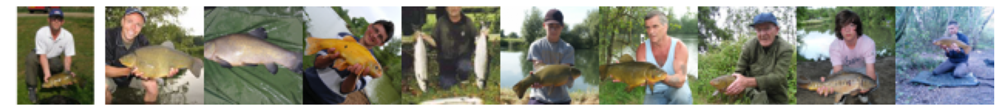

In [303]:
show_im_grid(train_sets[0][0:10] )


torch.Size([25, 3, 64, 64])


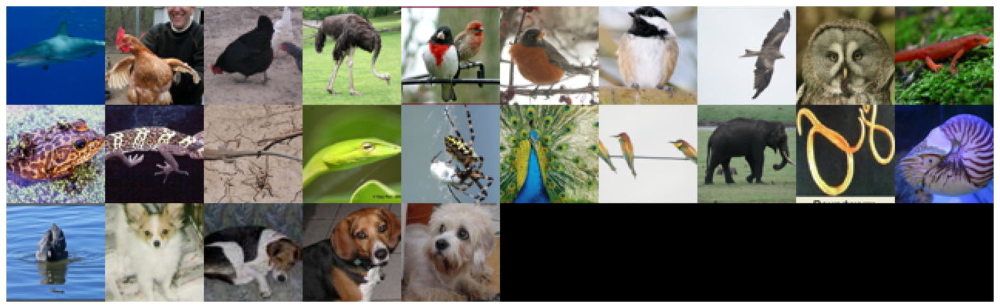

In [305]:
class_ids= [3,7,8,9,12,15,19,21,24,27,30, 38,41,59, 72,
            84,92,101, 111,117, 137,157,166,167,194]
# class_ids = range(len(train_sets))
cond_ims = torch.concatenate([train_sets[id][0:1] for id in class_ids])
print(cond_ims.shape)
show_im_grid(cond_ims, n_columns=10 )



## load pre-computed $\phi$

In [299]:
phis = torch.load('../results/phis_noise_ave_64x64_mixture-color-no-skip-deep_imagenet.pt', weights_only=True)
len(phis[255])

999

## load clusters

In [301]:
clusters_test = torch.load('../results/kmeans_64x64_mixture-color-no-skip-deep_imagenet_testset.pt', weights_only=False)
clusters_test.keys()

dict_keys([255, 150, 50, 10])

# 1) denoising 

In [504]:
sig_range

tensor([1.0233e+00, 1.9724e+00, 3.8019e+00, 7.3282e+00, 1.4125e+01, 2.7227e+01,
        5.2481e+01, 1.0116e+02, 1.9498e+02, 3.7584e+02, 7.2444e+02, 1.3964e+03,
        2.6915e+03, 5.1880e+03, 1.0000e+04])

In [502]:
## compute psnr 
sig_range = torch.logspace(.01,4,15)
all_data = torch.cat(train_sets)
all_data_test = torch.cat(test_sets)

psnr_test = {}
psnr_train = {}
for group in ['mixture-color', 'mixture-color-deep-no-skip', 'mixture-color-large-no-skip']: 

    ## train 
    print(group)
    if 'gray' in group.split('-'): 
        loader,_ = make_loader(dataset=all_data[0:512].mean(dim =1, keepdim=True), batch_size=512, dataset_cond=None, self_cond =False) 
    else: 
        loader,_ = make_loader(dataset=all_data[0:512], batch_size=512, dataset_cond=None, self_cond =False) 

    try:        
        if 'skip' in group.split('-'):
            skip = False
        else:
            skip = True
        
        psnr_train[group] = calc_psnr(denoisers[group],loader,sig_range , device,loader_cond = None, skip = skip)
        
        
    except KeyError: 
        pass

    ## test 
    if 'gray' in group.split('-'): 
        loader,_ = make_loader(dataset=all_data_test[0:512].mean(dim =1, keepdim=True), batch_size=512, dataset_cond=None, self_cond =False) 
    else: 
        loader,_ = make_loader(dataset=all_data_test[0:512], batch_size=512, dataset_cond=None, self_cond =False) 
        
          
    try: 
        if 'skip' in group.split('-'):
            skip = False
        else:
            skip = True
            
        psnr_test[group] = calc_psnr(denoisers[group],loader,sig_range, device, loader_cond=None, skip = skip)
    except KeyError: 
        pass


mixture-color
mixture-color-deep-no-skip
mixture-color-large-no-skip


mixture-color
mixture-color-deep-no-skip
mixture-color-large-no-skip


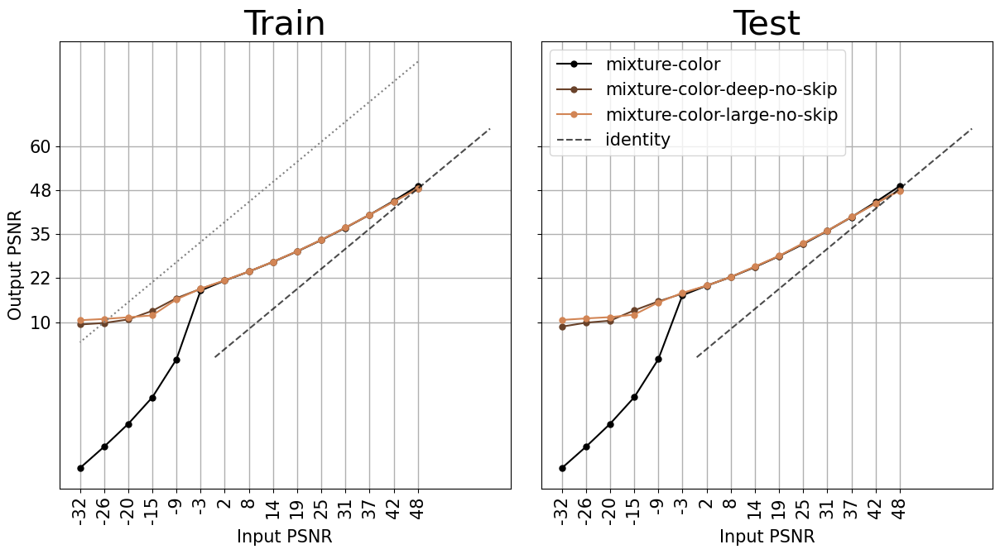

In [503]:
## plot 



f , axs = plt.subplots(1,2, figsize=(12,6), sharex = True, sharey=True)
plt.tight_layout()

for group in ['mixture-color', 'mixture-color-deep-no-skip', 'mixture-color-large-no-skip']:  
    x_axis = [ -10*np.log10( (float(std)/255)**2  ) for std in psnr_train[group].keys()]
    
    print(group)
    if 'color' in group.split('-'):
        ## train 
        axs[0].plot(x_axis, [psnr_train[group][key] for key in psnr_train[group].keys()], 
                    marker = '.',markersize = 10, label = group , alpha = 1)
        
        ## test 
        axs[1].plot(x_axis, [psnr_test[group][key] for key in psnr_test[group].keys()], 
                    marker = '.',markersize = 10,label =  group , alpha = 1)
for i in range(2):
    axs[i].set_xticks(x_axis);
    axs[i].grid(  linewidth=1);
    axs[i].set_xticklabels(np.round(x_axis).astype(int) ,rotation=90, fontsize=15)
    # axs[i].set_xlim(-5, 45)
    
    y_axis = np.linspace(10,60,5) 
    axs[i].set_yticks(y_axis);
    
    axs[i].set_yticklabels(np.round(y_axis).astype(int) , fontsize=15);
    # axs[i].set_ylim(15, 45)

    # axs[0].plot(x_axis, [ -10*np.log10( (std/255)**2  ) for std in sig_range/40 ],linestyle = 'dotted', label = 'expected from 1d manifold(N=1)')
    

    colormap = plt.cm.copper #nipy_spectral, Set1,Paired   
    plot_colors = [colormap(i) for i in np.linspace(0, 1, 3+1)]
    for k,j in enumerate(axs[i].lines):
        j.set_color(plot_colors[k])
axs[0].plot(x_axis, [ -10*np.log10( (std/255)**2  ) for std in sig_range/K ],linestyle = 'dotted', label = 
            'expected from 1d manifold(N=1)', color='gray')
axs[0].plot( [0,65],[0,65] ,'k--', alpha = .7, label = 'identity');
axs[1].plot( [0,65],[0,65] ,'k--', alpha = .7, label = 'identity');

    # axs[i].axvspan(0, 65, alpha=0.2);
axs[1].legend(fontsize = 15);
axs[0].set_title('Train', fontsize = 30)
axs[1].set_title('Test', fontsize = 30)
axs[0].set_xlabel('Input PSNR', fontsize = 15)
axs[0].set_ylabel('Output PSNR', fontsize = 15);
axs[1].set_xlabel('Input PSNR', fontsize = 15);


Text(0.5, 1.0, 'test')

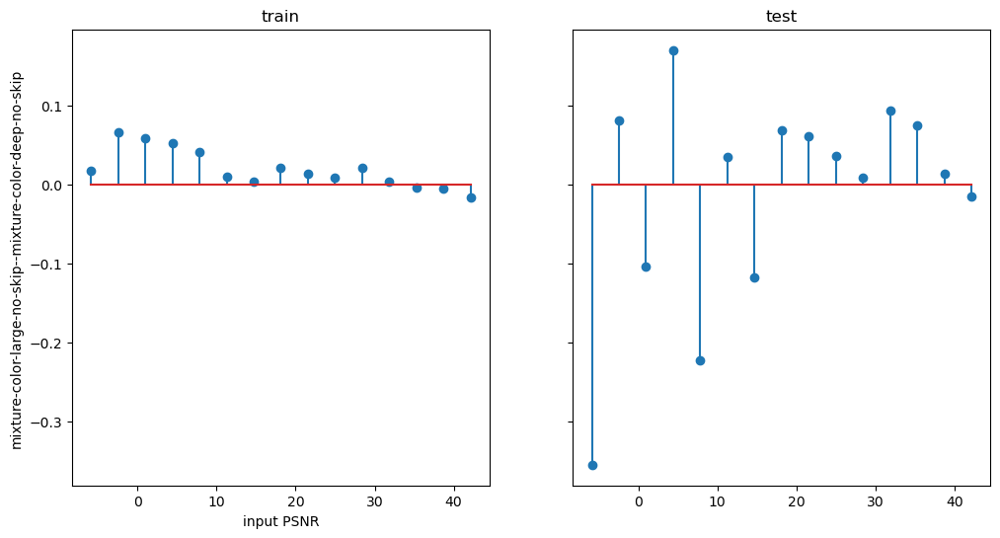

In [142]:
denoiser1 =  'mixture-color-large-no-skip'
denoiser2 = 'mixture-color-deep-no-skip'
f , axs = plt.subplots(1,2, figsize=(12,6), sharex = True, sharey=True)

axs[0].stem(x_axis,[psnr_train[denoiser1][key] - psnr_train[denoiser2][key] for key in psnr_train[group].keys()])
axs[1].stem(x_axis,[psnr_test[denoiser1][key] - psnr_test[denoiser2][key] for key in psnr_train[group].keys()])
axs[0].set_xlabel('input PSNR')
axs[0].set_ylabel(denoiser1+ '--'+ denoiser2)
axs[0].set_title('train')
axs[1].set_title('test')

# 2) Synthesis 

## sampling algorithm - forward

In [125]:
groups

dict_keys(['mixture-color', 'mixture-color-large-no-skip', 'mixture-color-large', 'mixture-color-deep-no-skip', 'mixture-modified-color', 'mixture-modified-color-large-no-skip', 'mixture-modified-color-large', 'mixture-modified-color-deep-no-skip'])

In [14]:
group = 'mixture-modified-color-deep-no-skip'
print(group)
for b in range(4):
    denoisers[group].matching_layers_enc[b] = False
for b in range(4):
    denoisers[group].matching_layers_dec[b] = True

denoisers[group].matching_mode = 'additive'
denoisers[group].match_std = True


print(denoisers[group].matching_layers_enc)
print(denoisers[group].matching_layers_mid)
print(denoisers[group].matching_layers_dec)

# blocks = ['en0','enc1', 'enc2','enc3','mid','dec3', 'dec2', 'dec1']
blocks = ['enc1', 'enc2','enc3','mid','dec3', 'dec2']


mixture-modified-color-deep-no-skip
{0: False, 1: False, 2: False, 3: False}
True
{0: True, 1: True, 2: True, 3: True}


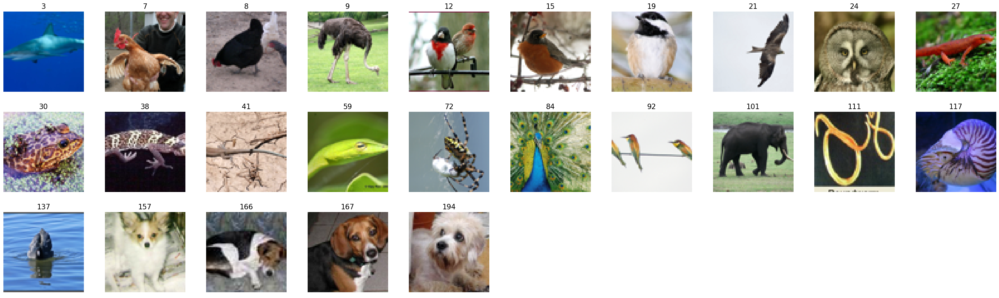

In [38]:
show_im_set(cond_ims, n_columns=10, sub_labels=class_ids )



In [26]:
groups

dict_keys(['mixture-color', 'mixture-color-large-no-skip', 'mixture-color-large', 'mixture-modified-color', 'mixture-modified-color-large-no-skip', 'mixture-modified-color-large', 'conditional-color-mid-only'])

In [20]:
group = 'mixture-modified-color-large-no-skip'

print(group)
for b in range(3):
    denoisers[group].matching_layers_enc[b] = False
for b in range(3):
    denoisers[group].matching_layers_dec[b] = True

denoisers[group].matching_layers_enc[3] = False    
print(denoisers[group].matching_layers_enc)
print(denoisers[group].matching_layers_mid)
print(denoisers[group].matching_layers_dec)
denoisers[group].matching_mode = 'additive'
denoisers[group].match_std = True

mixture-modified-color-large-no-skip
{0: False, 1: False, 2: False, 3: False}
True
{0: True, 1: True, 2: True, 3: True}


In [21]:


n_samples = 6
n_channels = 3
seed = 1
sig_L = .1
h0 = .01
beta = .01
freq = 100
fixed_h = True
stop_sig = 0
skip = True
if 'skip' in group.split('-'): 
    skip = False
all_sample = {}
all_interm = {}
for i in range(cond_ims.shape[0]): 
    if seed is not None: 
        torch.manual_seed(seed)
        
    print('------------------ ',i, ' ------------------')
    if 'gray' in group.split('-'): 
        n_channels = 1        
        x_c = cond_ims[i:i+1].mean(dim = 1, keepdim = True)
        init_im = dist_mean.mean(dim = 0, keepdim = True).to(device) +torch.randn(n_samples,n_channels,K,K, device = device).to(device)
    else: 
        x_c = cond_ims[i:i+1]
        init_im = dist_mean.to(device) +torch.randn(n_samples,n_channels,K,K, device = device).to(device)

           


    sample, interm_Ys,sigmas, _ = batch_conditional_synthesis(denoisers[group], 
                                                            x_c = x_c.to(device), 
                                                            noisy_conditioner=True,
                                                            average_phi=False ,
                                                            init_im =init_im,
                                                            sig_0=1, 
                                                            sig_L=sig_L, 
                                                            h0=h0 , 
                                                            beta=beta , 
                                                            freq=freq,
                                                            device=device, 
                                                            fixed_h = fixed_h,
                                                            max_T=10000, 
                                                            seed=seed, 
                                                            output_size=(n_samples,n_channels,K,K), 
                                                             skip=skip)
    

    all_sample[i] = sample.detach()
    all_interm[i] = interm_Ys

------------------  0  ------------------
----------------------------- 100
sigma  0.7026330828666687
mean  0.2733626067638397
----------------------------- 200
sigma  0.2741127014160156
mean  0.27159833908081055
-------- total number of iterations:  282
-------- final sigma,  0.09912131726741791
-------- final mean  0.25682100653648376
-------- final snr,  7.640681266784668
------------------  1  ------------------
----------------------------- 100
sigma  0.4094007909297943
mean  0.2946299612522125
-------- total number of iterations:  150
-------- final sigma,  0.09600379317998886
-------- final mean  0.2906593084335327
-------- final snr,  8.201093077659607
------------------  2  ------------------
----------------------------- 100
sigma  0.5564984679222107
mean  0.40220704674720764
-------- total number of iterations:  192
-------- final sigma,  0.09820608794689178
-------- final mean  0.4089212715625763
-------- final snr,  6.955410838127136
------------------  3  ----------------

In [ ]:
print('denoiser:',group, ',stop_sig:', stop_sig,
       denoisers[group].matching_layers_enc, 
       denoisers[group].matching_layers_mid,       
       denoisers[group].matching_layers_dec,    
      ',fixed_h:',fixed_h ,
      ' , sig_L:',sig_L ,
      ' , h0:', h0 , 
      ' , beta:', beta , 
      ', seed:', seed)
for i in range(cond_ims.shape[0]): 
    show_im_set(torch.concatenate([cond_ims[i:i+1],all_sample[i].cpu()]), n_columns=7, label = 'class id: '+str(i), 
               sub_labels= ['cond'] + list(range(n_samples) ),font_size=15 )


# Stored samples 
## forward matching 

In [319]:
stored_sampels_small_additive = torch.load('../results/samples_80x80_match_dec_additive_mixture-modified-color-small_imagenet.pt',weights_only=True)
stored_sampels_small_multiplicative = torch.load('../results/samples_80x80_match_dec_multiplicative_mixture-modified-color-small_imagenet.pt',weights_only=True)

stored_sampels_large_additive = torch.load('../results/samples_80x80_match_dec_additive_mixture-modified-color-large_imagenet.pt',weights_only=True)
stored_sampels_large_multiplicative = torch.load('../results/samples_80x80_match_dec_multiplicative_mixture-modified-color-large_imagenet.pt',weights_only=True)

stored_sampels_large_no_skip_additive = torch.load('../results/samples_80x80_match_dec_additive_mixture-modified-color-large-no-skip_imagenet.pt',weights_only=True)
stored_sampels_large_no_skip_multiplicative = torch.load('../results/samples_80x80_match_dec_multiplicative_mixture-modified-color-large-no-skip_imagenet.pt',weights_only=True)

stored_sampels_deep_no_skip_multiplicative = torch.load('../results/samples_80x80_match_dec_multiplicative_mixture-modified-color-no-skip-deep_imagenet.pt',weights_only=True)


stored_sampels_large_no_skip_var = torch.load('../results/samples_80x80_match_dec_mean_var_additive_mixture-modified-color-large-no-skip_imagenet.pt',weights_only=True)
stored_sampels_deep_no_skip_var = torch.load('../results/samples_80x80_match_dec_mean_var_additive_mixture-modified-color-no-skip-deep_imagenet.pt',weights_only=True)



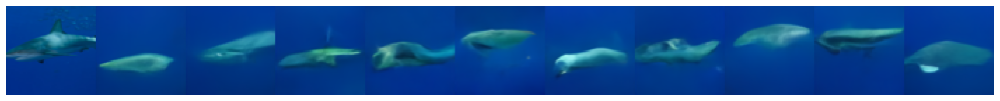

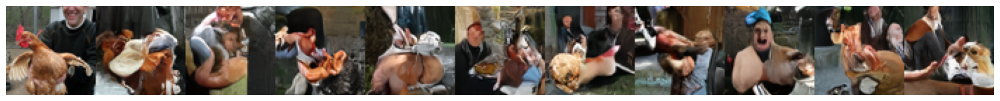

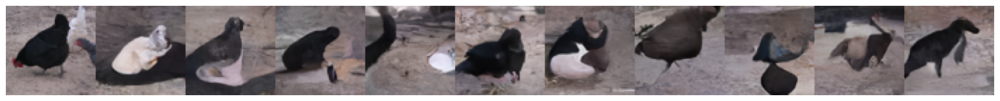

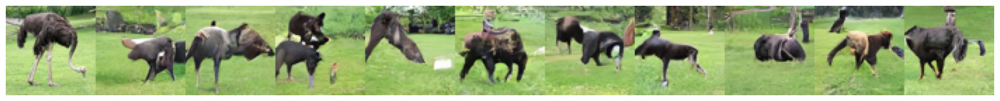

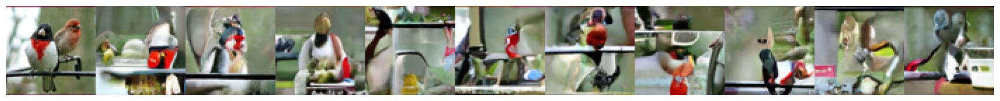

...

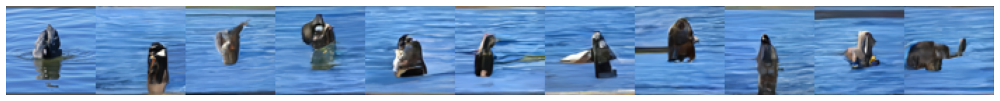

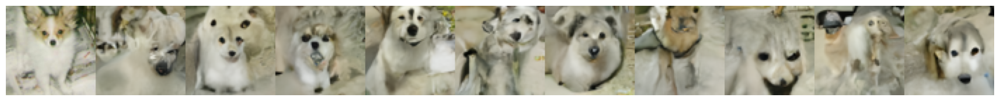

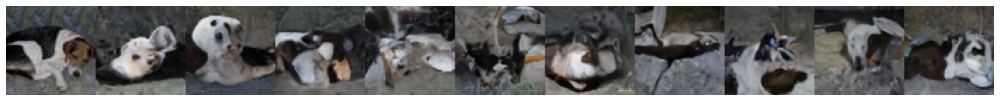

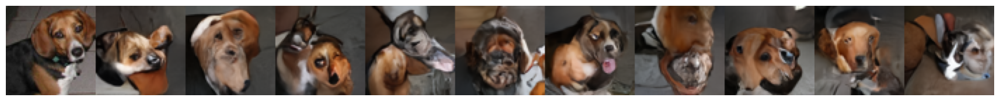

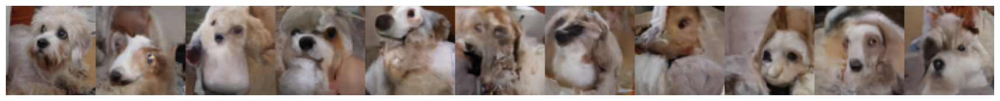

In [321]:
for id in stored_sampels_large_additive.keys(): 
    # if id <100 :
        # show_im_set( torch.clip(torch.cat([train_sets[id][0:1], stored_sampels_small_additive[id].cpu()]), 0,1) 
        #              ,label='', n_columns=11)        
        # show_im_set( torch.clip(torch.cat([train_sets[id][0:1], stored_sampels_large_additive[id].cpu()]), 0,1) 
        #              ,label='', n_columns=11)    
        # show_im_set( torch.clip(torch.cat([train_sets[id][0:1], stored_sampels_large_no_skip_additive[id].cpu()]), 0,1) 
        #              ,label='', n_columns=11) 
        # ###
        # show_im_set( torch.clip(torch.cat([train_sets[id][0:1], stored_sampels_small_multiplicative[id].cpu()]), 0,1) 
        #              ,label='', n_columns=11)        
        # show_im_set( torch.clip(torch.cat([train_sets[id][0:1], stored_sampels_large_multiplicative[id].cpu()]), 0,1) 
        #              ,label='', n_columns=11)    
        # show_im_set( torch.clip(torch.cat([train_sets[id][0:1], stored_sampels_large_no_skip_multiplicative[id].cpu()]), 0,1) 
        #              ,label='', n_columns=11) 
        # show_im_set( torch.clip(torch.cat([train_sets[id][0:1], stored_sampels_deep_no_skip_multiplicative[id].cpu()]), 0,1) 
        #              ,label='', n_columns=11) 
        # show_im_set( torch.clip(torch.cat([train_sets[id][0:1], stored_sampels_large_no_skip_var[id].cpu()]), 0,1) 
                     # ,label='', n_columns=11) 
        show_im_grid( torch.clip(torch.cat([train_sets[id][0:1], stored_sampels_deep_no_skip_var[id].cpu()]), 0,1) 
                     ,label='', n_columns=11) 
        # show_im_set( torch.clip(stored_sampels_large_no_skip_var_128[id].cpu(), 0,1) 
                     # ,label='', n_columns=11) 

### check if phis matched

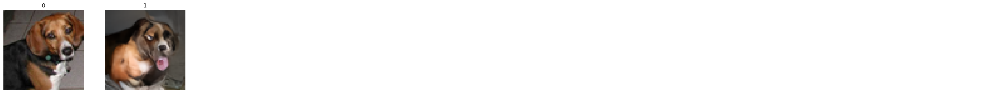

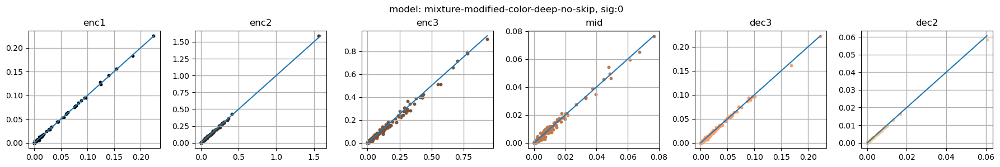

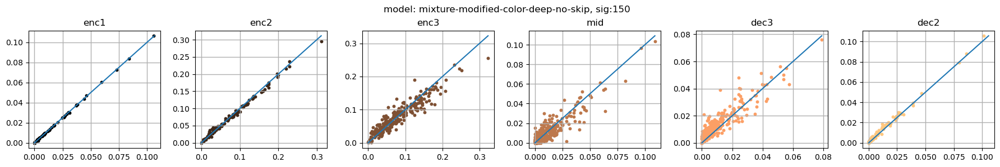

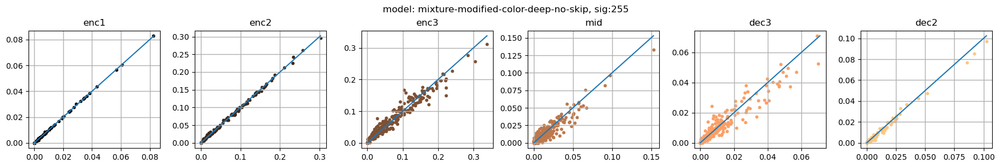

In [148]:
### compare two classes against each other ####
colormap = plt.cm.copper #nipy_spectral, Set1,Paired   
plot_colors = [colormap(i) for i in np.linspace(0, 1,len(blocks))]

id = class_ids[23]

sigmas = [0,150,255]
i = 5

for  j in  range(len(sigmas)): 
    sig = sigmas[j]    
   


    noise = torch.randn(1,n_channels , K, K ) * sig/255
    im1_cond = train_sets[id][0:1] + noise 
    im2_cond = stored_sampels_deep_no_skip_var[id][i:i+1].cpu() + noise 
    # im2_cond = train_sets[id][1:2].cpu() + noise
    
    if sig == 0:
        if 'color'  in group.split('-'):  
            show_im_set(torch.vstack((im1_cond, im2_cond ) ),  n_columns=10)
        else: 
            show_im_set(torch.vstack((im1_cond.mean(dim = 1, keepdim = True), im2_cond.mean(dim = 1, keepdim = True) ) ),  n_columns=10)
        
        

    phi_conditioner,_= get_channel_means(denoisers[group], x1=im1_cond ,x2=im1_cond, 
                               average_phi=False, 
                               with_params=False , 
                               return_activations=False)
    phi_sample,_ = get_channel_means(denoisers[group], x1=im2_cond ,x2=im1_cond, 
                                   average_phi=False, 
                                   with_params=False , 
                                   return_activations=False)
        
        
    f , axs = plt.subplots(1,len(blocks), figsize=(18,3), sharex =False, sharey=False)
    f.suptitle('model: ' + group+ ', sig:'+ str(sig))
    plt.tight_layout() 

    for i in range( len(blocks) ): 
        axs[i].scatter( (phi_conditioner[i]).cpu().abs(), (phi_sample[i]).cpu().abs(), marker ='.' , color=plot_colors[i])
        axs[i].scatter( (phi_conditioner[i]).cpu().abs(), (phi_sample[i]).cpu().abs(), marker ='.' , color=plot_colors[i])
    
        axs[i].set_title(blocks[i])
        axs[i].grid(  linewidth=1);
        axs[i].plot([min((phi_conditioner[i]).cpu().abs().min(), (phi_sample[i]).cpu().abs().min()),max((phi_conditioner[i]).cpu().abs().max(), (phi_sample[i]).cpu().abs().max())],
                    [min((phi_conditioner[i]).cpu().abs().min(), (phi_sample[i]).cpu().abs().min()),max((phi_conditioner[i]).cpu().abs().max(), (phi_sample[i]).cpu().abs().max())])


